# 1. Simple Image Operations

## Table of Contents
1. [Libraries](#libraries)
2. [Loading Images](#loading)
3. [Resizing Images](#resize)
4. [Negative Images](#negative)
5. [Logarithmic Transformation](#log)
6. [Image Binarizer](#bin)
7. [Image Quantizer](#quant)
8. [Image brightness and contrast](#brightness)

# Equipo 10

Integrantes:

*   Diego Fernando Guerra Burgos - A01793499
*   Esteban Sánchez Retamoza - A01740631
*   Hansel Zapiain Rodríguez - A00469031
*   Julio César Ruíz Marks - A01794742
*   Salvador Martínez Morales - A01273366

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [ ]:
from matplotlib import image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
DIR = "/content/drive/MyDrive/Visión computacional - Actividades/Semana 2"
os.chdir(DIR)

## Loading Images <a class="anchor" id="loading"></a>

<class 'numpy.ndarray'>


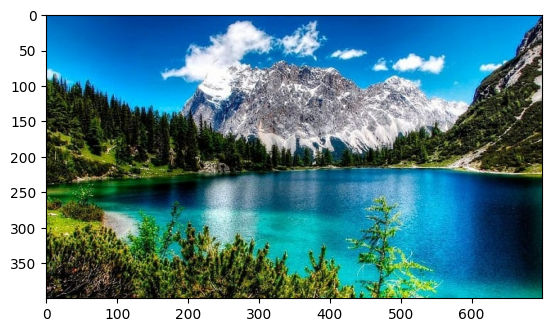

In [ ]:
img1 = mpimg.imread('data/image.jpg')
plt.imshow(img1)
print(type(img1))

Look at the shape of this array:

In [ ]:
img1.shape

(400, 700, 3)

The image is actually composed of three "layers, or *channels*, for red, green, and blue (RGB) pixel intensities.

Display the same image but this time we'll use another popular Python library for working with images - **cv2**.

numpy.ndarray

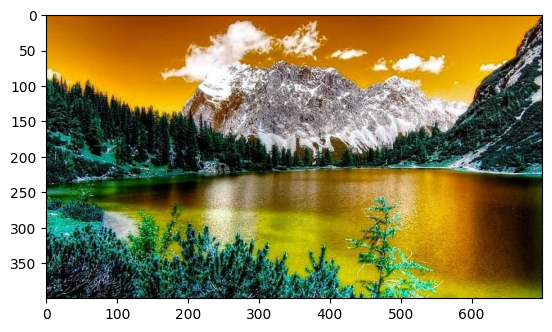

In [ ]:
img2 = cv2.imread('data/image.jpg')
plt.imshow(img2)
type(img2)

The trouble is that cv2 loads the array of image data with the channels ordered as blue, green, red (BGR) instead of red, green blue (RGB).

Let's fix that

AxesImage(size=(400, 700))


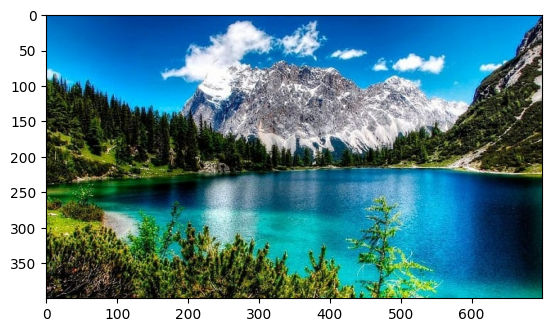

In [ ]:
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
print(plt.imshow(img2))

Lastly, one more commonly used library for image processing in Python we should consider - **PIL**:

<class 'PIL.JpegImagePlugin.JpegImageFile'>


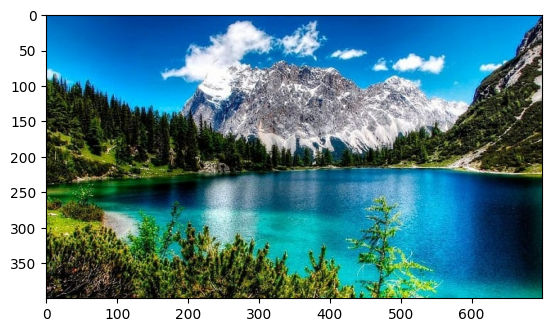

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

img3 = Image.open('data/image.jpg')
plt.imshow(img3)
print(type(img3))

It's easy to convert a PIL JpegImageFile to a numpy array

In [ ]:
img3 = np.array(img3)
img3.shape

(400, 700, 3)

Saving a numpy array in an optimized format, should you need to persist images into storage

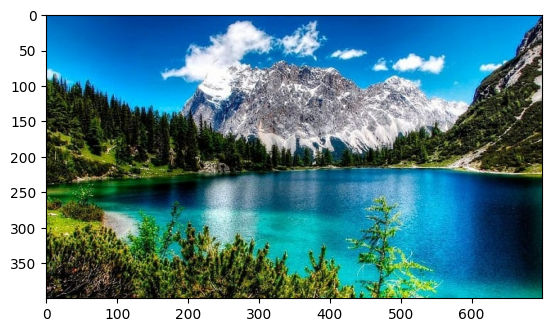

In [ ]:
# Save the image
np.save('data/img.npy', img3)

# Load the image
img3 = np.load('data/img.npy')

plt.imshow(img3)

## Resizing an Image <a class="anchor" id="resize"></a>
One of the most common manipulations of an image is to resize it.

Generally, we want to ensure that all of your training images have consistent dimensions.

Original size: 700 x 400
New size: 200 x 200


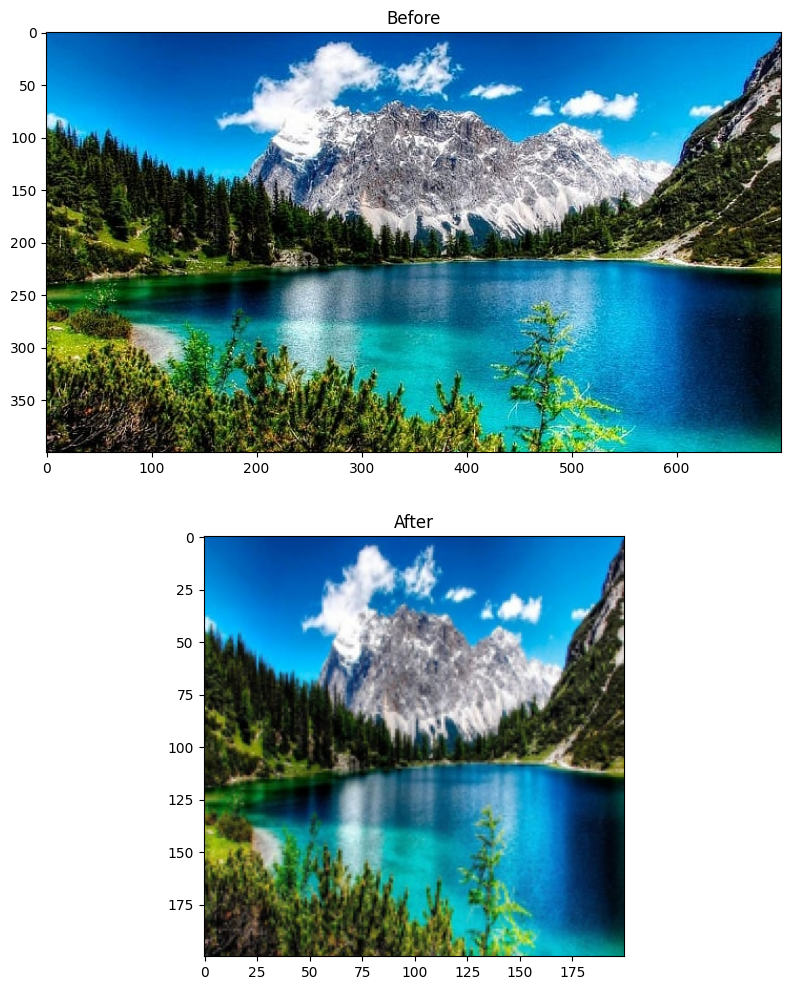

In [ ]:
from PIL import Image, ImageOps

# Load the image array into a PIL Image
orig_img = Image.fromarray(img3)

# Get the image size
o_h, o_w = orig_img.size
print('Original size:', o_h, 'x', o_w)

# We'll resize this so it's 200 x 200
target_size = (200,200)
new_img = orig_img.resize(target_size)
n_h, n_w = new_img.size
print('New size:', n_h, 'x', n_w)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Before')

# Subplot for resized image
a=fig.add_subplot(2,1,2)
imgplot = plt.imshow(new_img)
a.set_title('After')

plt.show()


If we want to resize the image and change its shape without distorting it, we'll need to *scale* the image so that its largest dimension fits our new desired size.

Original size: 700 x 400
Scaled size: 200 x 114
New size: 200 x 200


<ipython-input-12-7d254277b796>:10: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  scaled_img.thumbnail(target_size, Image.ANTIALIAS)


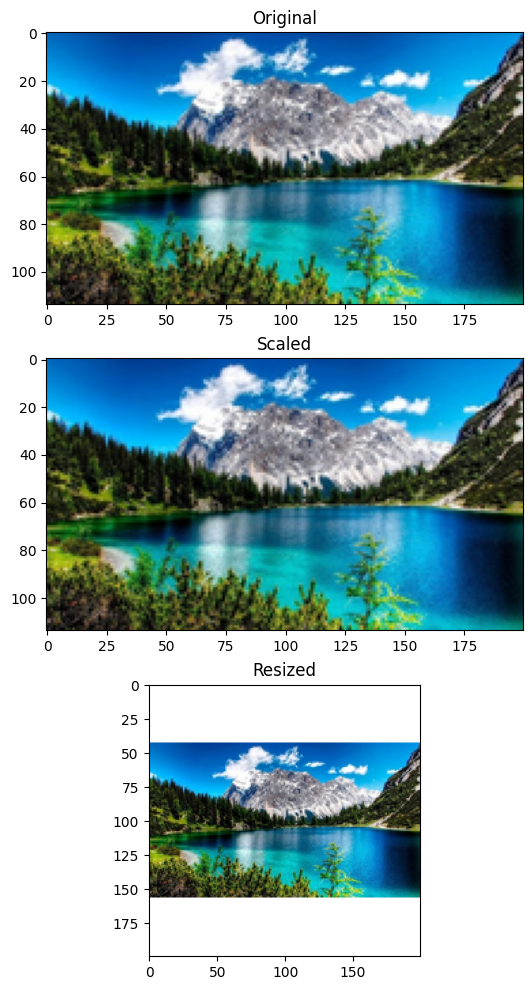

In [ ]:
# Get the image size
orig_height, orig_width = orig_img.size
print('Original size:', orig_height, 'x', orig_width)

# We'll resize this so it's 200 x 200
target_size = (200,200)

# Scale the image to the new size using the thumbnail method
scaled_img = orig_img
scaled_img.thumbnail(target_size, Image.ANTIALIAS)
scaled_height, scaled_width = scaled_img.size
print('Scaled size:', scaled_height, 'x', scaled_width)

# Create a new white image of the target size to be the background
new_img = Image.new("RGB", target_size, (255, 255, 255))

# paste the scaled image into the center of the white background image
new_img.paste(scaled_img, (int((target_size[0] - scaled_img.size[0]) / 2), int((target_size[1] - scaled_img.size[1]) / 2)))
new_height, new_width = new_img.size
print('New size:', new_height, 'x', new_width)

# Show the original and resized images
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Subplot for original image
a=fig.add_subplot(3,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

# Subplot for scaled image
a=fig.add_subplot(3,1,2)
imgplot = plt.imshow(scaled_img)
a.set_title('Scaled')

# Subplot for resized image
a=fig.add_subplot(3,1,3)
imgplot = plt.imshow(new_img)
a.set_title('Resized')

plt.show()

## Negative Images <a class="anchor" id="negative"></a>

In [ ]:
orig_img = cv2.imread('data/image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)
img_neg = 255 - orig_img

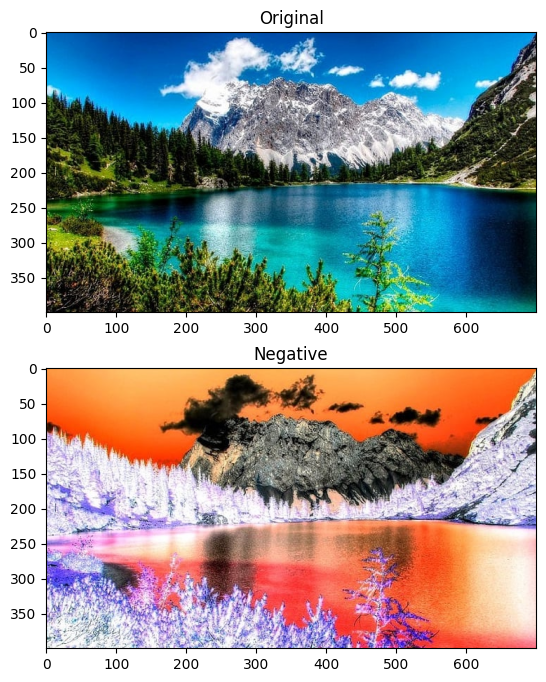

In [ ]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(img_neg)
a.set_title('Negative')

plt.show()

## Logarithmic Transformation <a class="anchor" id="log"></a>

$$
S = c * log (1 + r)
$$

where,
- $R$ = input pixel value
- $C$ = scaling constant and
- $S$ = output pixel value

The value of $c$ is chosen such that we get the maximum output value corresponding to the bit size used. So, the formula for calculating $c$  is as follows:

$c = 255 / (log (1 + $ max input pixel value $))$

In [ ]:
orig_img = cv2.imread('data/image.jpg')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

# Apply log transformation method
c = 255 / np.log(1 + np.max(orig_img))
log_img = c * (np.log(orig_img + 1))

# Specify the data type so that
# float value will be converted to int
log_img = np.array(log_img, dtype = np.uint8)

<ipython-input-15-df301d760c24>:6: RuntimeWarning: divide by zero encountered in log
  log_img = c * (np.log(orig_img + 1))


Log transformation of gives actual information by enhancing the image. If we apply this method in an image having higher pixel values then it will enhance the image more and actual information of the image will be lost.

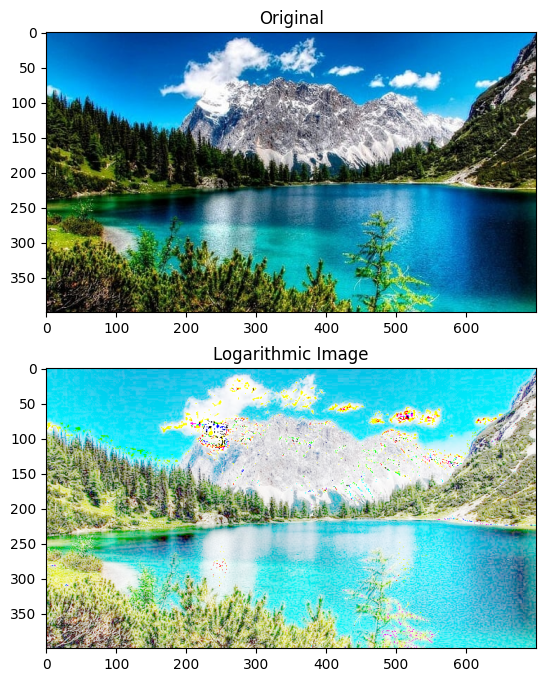

In [ ]:
fig = plt.figure(figsize=(8, 8))

# Subplot for original image
a=fig.add_subplot(2,1,1)
imgplot = plt.imshow(orig_img)
a.set_title('Original')

a = fig.add_subplot(2,1,2)
imgplot = plt.imshow(log_img)
a.set_title('Logarithmic Image')

plt.show()

## Image Binarizer (Thresholding) <a class="anchor" id="bin"></a>

Binarize pixels (set pixel values to 0 or 1) according to a threshold.

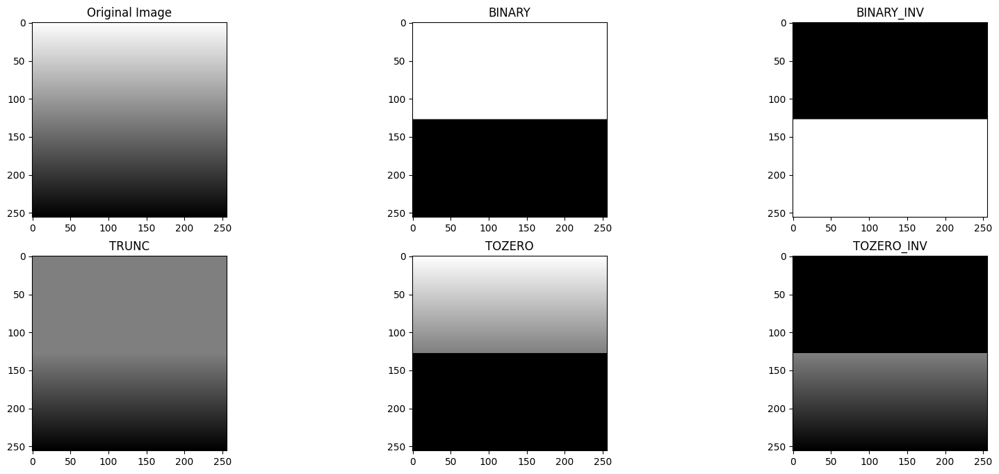

In [ ]:
orig_img = cv2.imread('data/linear_gradient.png')
orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

ret,thresh1 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY)
ret,thresh2 = cv2.threshold(orig_img,127,255,cv2.THRESH_BINARY_INV)
ret,thresh3 = cv2.threshold(orig_img,127,255,cv2.THRESH_TRUNC)
ret,thresh4 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO)
ret,thresh5 = cv2.threshold(orig_img,127,255,cv2.THRESH_TOZERO_INV)

titles = ['Original Image','BINARY','BINARY_INV','TRUNC','TOZERO','TOZERO_INV']
images = [orig_img, thresh1, thresh2, thresh3, thresh4, thresh5]
n = np.arange(6)

fig = plt.figure(figsize=(20, 8))
for i in n:
  plt.subplot(2,3,i+1), plt.imshow(images[i],'gray')
  plt.title(titles[i])

plt.show()

## Image Quantizer  <a class="anchor" id="quant"></a>

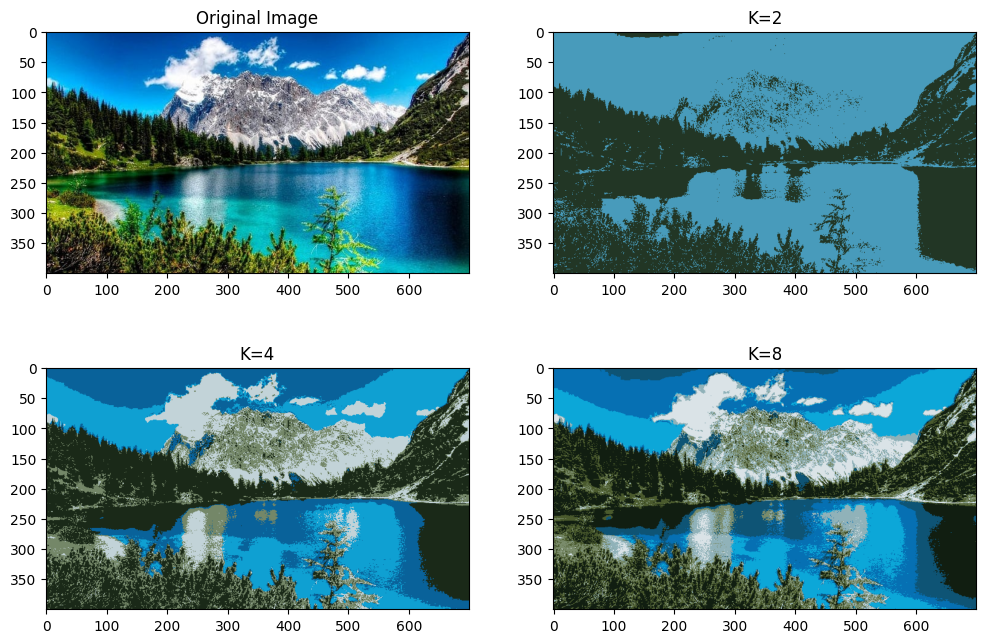

In [ ]:
orig_img = cv2.imread('data/image.jpg')

Z = orig_img.reshape((-1,3))

# convert to np.float32
Z = np.float32(Z)

# define criteria, number of clusters(K) and apply kmeans()
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
def colorQuant(Z, K, criteria):

   ret,label,center=cv2.kmeans(Z,K,None,criteria,10,cv2.KMEANS_RANDOM_CENTERS)

   # Now convert back into uint8, and make original image
   center = np.uint8(center)
   res = center[label.flatten()]
   res2 = res.reshape((orig_img.shape))
   return res2
res1 = colorQuant(Z, 2, criteria)
res2 = colorQuant(Z, 5, criteria)
res3 = colorQuant(Z, 8, criteria)

fig = plt.figure(figsize=(12, 8))

plt.subplot(221),plt.imshow(cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(222),plt.imshow(cv2.cvtColor(res1, cv2.COLOR_BGR2RGB))
plt.title('K=2')

plt.subplot(223),plt.imshow(cv2.cvtColor(res2, cv2.COLOR_BGR2RGB))
plt.title('K=4')

plt.subplot(224),plt.imshow(cv2.cvtColor(res3, cv2.COLOR_BGR2RGB))
plt.title('K=8')

plt.show()

## Ejercicio 1  <a class="anchor" id="averaging"></a>

Las transformaciones pixel a pixel son sumamente utilizadas para aumentar la cantidad de imágenes para entrenar modelos de inteligencia artificial, sobre todo aquellas de tipo fotométrico. Investiga 3 tipos de transformaciones y aplicarlas en el proyecto de Google Collab sobre imágenes propias.

## Image brightness and contrast  <a class="anchor" id="brightness"></a>

Brightness refers to the overall lightness or darkness of an image. in the context of digital images, it is determined by the intensity of the light that is emited or reflected by each pixel. Increasing brightness makes the image appear ligher, while decreasing it makes the image appear darker.
Contrast, relates to the difference in iluminance or color between the light and dark parts of an image. A high-contrast image has distinct and well-defined differences between its light and dark areas, while a low-contrast image less noticeable distinctions.

In [ ]:
orig_img_1 = cv2.imread('data/luna_1.jpeg')

adjust_image = cv2.convertScaleAbs(orig_img_1, alpha=1.5, beta=30)
adjust_image_2 = cv2.convertScaleAbs(orig_img_1, alpha=0.7, beta=-10)

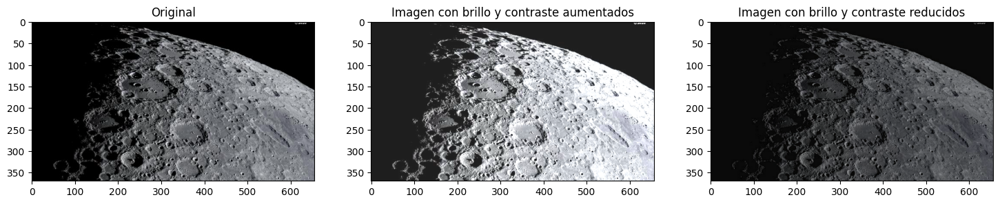

In [ ]:
fig = plt.figure(figsize=(18, 20))

# Subplot for original image
a=fig.add_subplot(1,3,1)
imgplot = plt.imshow(orig_img_1)
a.set_title('Original')

a = fig.add_subplot(1,3,2)
imgplot = plt.imshow(adjust_image)
a.set_title('Imagen con brillo y contraste aumentados')

a = fig.add_subplot(1,3,3)
imgplot = plt.imshow(adjust_image_2)
a.set_title('Imagen con brillo y contraste reducidos')

plt.show()

## Image averaging  <a class="anchor" id="averaging"></a>

Image averaging is a technique used in image processing qhen multiple images are cobined to create a new image. This is often done to reduce noise and endhance the overall image quality. In the context of digital images, each pixel's value in the new image is computed as the average of the corresponding pixels in the input images. This can help smoot out variations and improve the signal-to-noise ratio.

In [ ]:
orig_img_people = cv2.imread('data/radiografia.jpg')
orig_img_people = cv2.cvtColor(orig_img_people, cv2.COLOR_BGR2RGB)

image1_float = orig_img_people.astype(float)
image2_float = orig_img_people.astype(float)
image3_float = orig_img_people.astype(float)
image4_float = orig_img_people.astype(float)

average_image = (image1_float+image2_float+image3_float+image4_float)/4

average_image = average_image.astype(np.uint8)

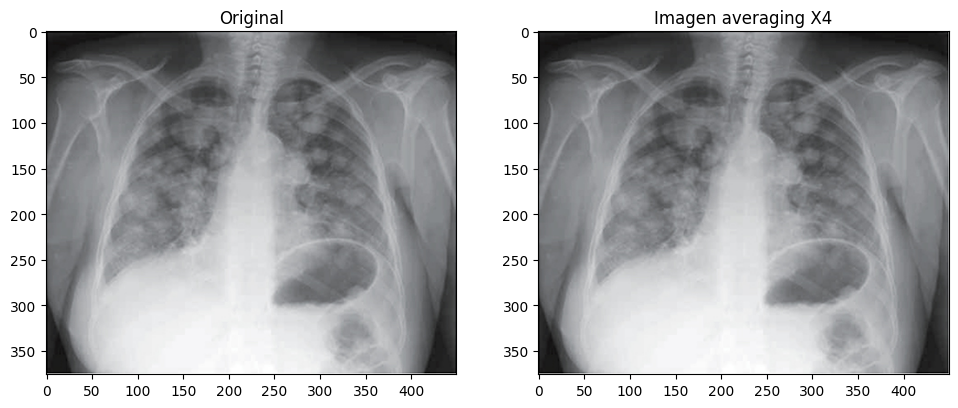

In [ ]:
fig = plt.figure(figsize=(18, 20))

# Subplot for original image
a=fig.add_subplot(1,3,1)
imgplot = plt.imshow(orig_img_people)
a.set_title('Original')

a = fig.add_subplot(1,3,2)
imgplot = plt.imshow(average_image)
a.set_title('Imagen averaging X4')

plt.show()

## Image product  <a class="anchor" id="averaging"></a>

Image product typically refest to the result of multuplying corresponding pixel values of two or more images. This poeration is comonly used in image processing and computer vision. Each pixel in the product image is calculated by multiplying the corresponding pixel values of the input images. This operation can have various applications, such as enhancing certain features images or highlighting areas of interest.

In [ ]:
orig_img_galaxy = cv2.imread('data/galaxia.jpg')
orig_img_galaxy = cv2.cvtColor(orig_img_galaxy, cv2.COLOR_BGR2RGB)

mask = np.zeros(orig_img_galaxy.shape[:2], dtype=np.uint8)
cv2.rectangle(mask, (100,100), (500,500),(255), thickness=cv2.FILLED)

image1_float = orig_img_galaxy.astype(float)
image1_roi = cv2.bitwise_and(image1_float, image1_float, mask=mask)

product_image_roi = image1_roi.astype(np.uint8)

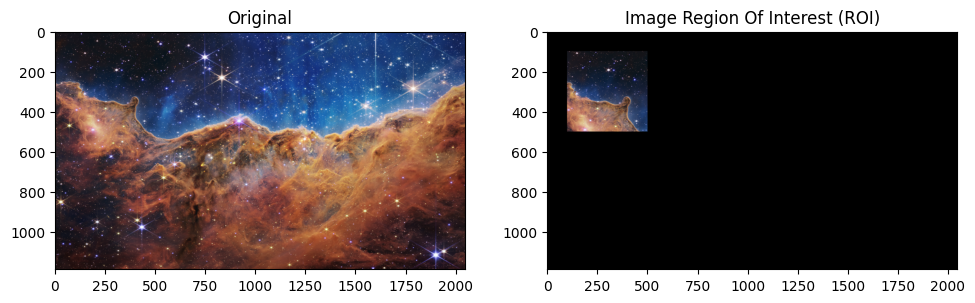

In [ ]:
fig = plt.figure(figsize=(18, 20))

# Subplot for original image
a=fig.add_subplot(1,3,1)
imgplot = plt.imshow(orig_img_galaxy)
a.set_title('Original')

a = fig.add_subplot(1,3,2)
imgplot = plt.imshow(product_image_roi)
a.set_title('Image Region Of Interest (ROI)')

plt.show()

## Ejercicio 2  <a class="anchor" id="averaging"></a>

Investiga una aplicación donde obtener el negativo de imagen tenga un valor específico e integra el código en en una fila de google collab, justificar brevemente tu investigación y haciendo una demo sencilla.

Esta estratégia de imagen y video puede tener muchas aplicaciones como:
1.  Fotografía Artística
2.  Edición de video
3.  Reconocimiento de objetos
4.  Seguridad y marcas de agua
5.  Presentación de diapositivas
6.  Experimentación artística
7.  Detección de bordes
8.  Fotografía forense

Entre las que más me parecieron interesantes es el reconocimiento de objetos, comúnmente utilizado apra algoritmos como la conducción autónoma de vehiculos

In [ ]:
orig_img_car = cv2.imread('data/steet.png')
orig_img_car = cv2.cvtColor(orig_img_car, cv2.COLOR_BGR2RGB)

img_negative = 255 - orig_img_car

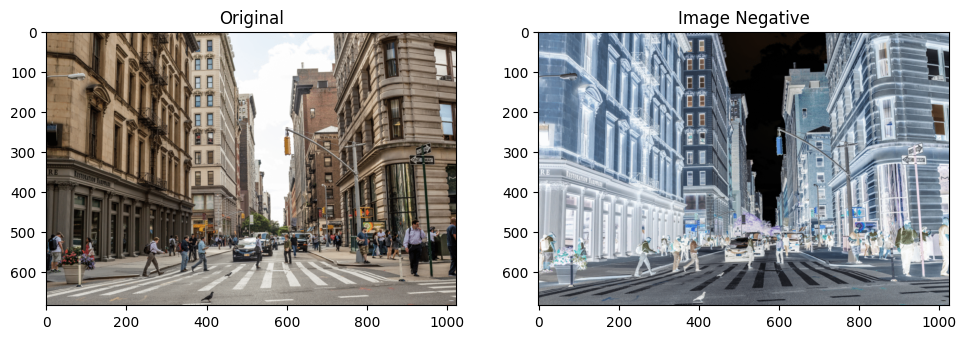

In [ ]:
fig = plt.figure(figsize=(18, 20))

# Subplot for original image
a=fig.add_subplot(1,3,1)
imgplot = plt.imshow(orig_img_car)
a.set_title('Original')

a = fig.add_subplot(1,3,2)
imgplot = plt.imshow(img_negative)
a.set_title('Image Negative')

plt.show()

## Ejercicio 3  <a class="anchor" id="averaging"></a>

Investiga una aplicación donde se puede aplicar la corrección de gamma en una imagen. Integra el código en en una fila de google collab, justifica brevemente tu investigación y haz una demo sencilla.

Una técnica que ha mostrado resultados prometedores en la mejora de la precisión del análisis visual es la corrección gamma. La corrección gamma es una operación matemática que se realiza en una imagen para mejorar su color y contraste. Se usa comúnmente en aplicaciones de edición de video y procesamiento de imágenes para mejorar la calidad general de las imágenes.

La corrección gamma funciona ajustando los niveles de brillo de una imagen en función de una relación no lineal entre los valores de luminancia de entrada y salida. Este ajuste ayuda a compensar las diferencias en la percepción humana de la intensidad de la luz, lo que da como resultado imágenes más precisas y agradables a la vista.

El uso de la corrección gamma puede mejorar la reproducción del color, lo que permite obtener imágenes más vibrantes y realistas.

Displaycalibration. (2023, November 10). Mejora de la calidad de la imagen a través de la corrección gamma para mejorar la precisión y el contraste. displaycalibration.de. https://www.displaycalibration.de/es/mejora-de-la-calidad-de-la-imagen-a-traves-de-la-correccion-gamma-para-mejorar-la-precision-y-el-contraste#:~:text=La%20correcci%C3%B3n%20gamma%20es%20una%20operaci%C3%B3n%20matem%C3%A1tica%20que%20se%20realiza,calidad%20general%20de%20las%20im%C3%A1genes.

In [ ]:
orig_img_light = cv2.imread('data/poca_luz.jpg')
orig_img_light = cv2.cvtColor(orig_img_light, cv2.COLOR_BGR2RGB)

gamma = 0.5
image_correct = np.power(orig_img_light / float(np.max(orig_img_light)), gamma) * 255.0

image_correct = image_correct.astype(np.uint8)

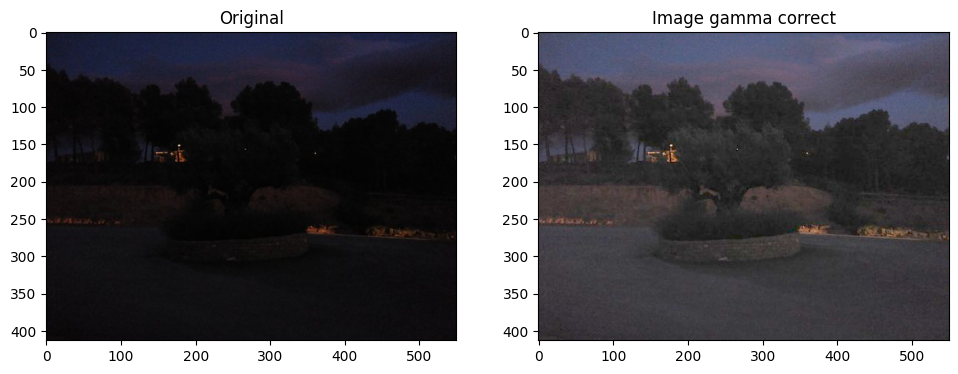

In [ ]:
fig = plt.figure(figsize=(18, 20))

# Subplot for original image
a=fig.add_subplot(1,3,1)
imgplot = plt.imshow(orig_img_light)
a.set_title('Original')

a = fig.add_subplot(1,3,2)
imgplot = plt.imshow(image_correct)
a.set_title('Image gamma correct')

plt.show()

## Ejercicio 4  <a class="anchor" id="averaging"></a>

Investiga una aplicación donde se puede usar la sustracción de imágenes e integra el código en en una fila de google collab, justificar brevemente tu investigación, haciendo una demo sencilla.

Este tipo de análisis son comunmente utilizados para la detección de errores, movimiento y análisis de video. Muy útil en sectores cmo la industria (calidad de productos y desgaste de maquinaria), así como, aplicaciones en seguridad y circuito cerrado.

In [ ]:
orig_img1 = cv2.imread('data/foto_1.jpg')
orig_img2 = cv2.imread('data/foto_2.jpg')
orig_img1 = cv2.cvtColor(orig_img1, cv2.COLOR_BGR2RGB)
orig_img2 = cv2.cvtColor(orig_img2, cv2.COLOR_BGR2RGB)

img1_float = orig_img1.astype(np.float32)
img2_float = orig_img2.astype(np.float32)

result_substraction = cv2.subtract(img1_float,img2_float)

result_substraction = np.clip(result_substraction, 0, 255).astype(np.uint8)

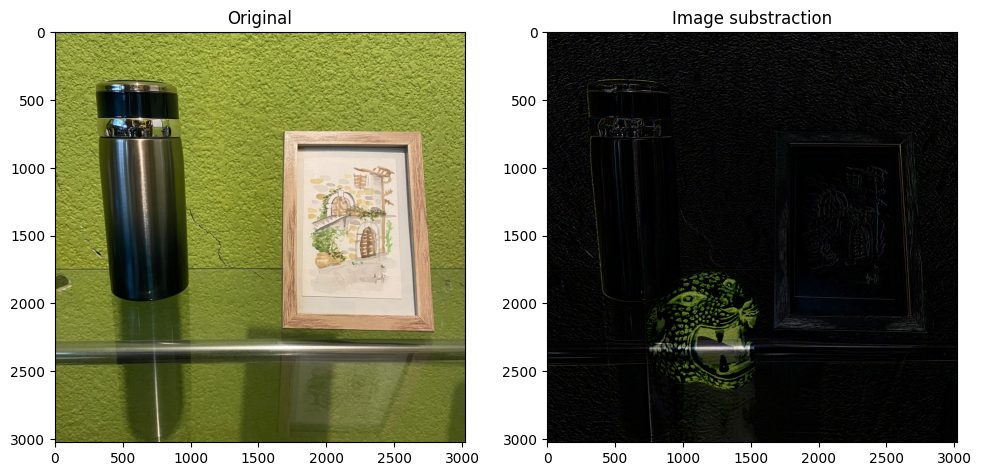

In [ ]:
fig = plt.figure(figsize=(18, 20))

# Subplot for original image
a=fig.add_subplot(1,3,1)
imgplot = plt.imshow(orig_img1)
a.set_title('Original')

a = fig.add_subplot(1,3,2)
imgplot = plt.imshow(result_substraction)
a.set_title('Image substraction')

plt.show()